# **<center><font style="color:rgb(100,109,254)">Designing Advanced Image Filters in OpenCV | Creating Instagram Filters - Pt 3⁄3</font> </center>**


<center><img src = 'https://drive.google.com/uc?export=download&id=1wNQUiTXGP3dtOtIC2xxQS3QJJ_i8GumK'  width=1000></center>

### **<font style="color:rgb(134,19,348)">Outline </font>**

We will be creating the following filters-like effects in this tutorial.

1. **Warm Filter**
2. **Cold Filter**
3. **Gotham Filter**
4. **GrayScale Filter**
5. **Sepia Filter**
6. **Pencil Sketch Filter**
7. **Sharpening Filter**
8. **Detail Enhancing Filter**
9. **Invert Filter**
10. **Stylization Filter**

Alright, so without further ado, let's dive in.

### **<font style="color:rgb(134,19,348)"> Import the Libraries</font>**

We will start by importing the required libraries.

In [9]:
import cv2
import pygame
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline

## **<font style="color:rgb(134,19,348)">Creating Warm Filter-like Effect</font>**

The first filter is gonna be the famous Warm Effect, it absorbs blue cast in images, often caused by electronic flash or outdoor shade, and improves skin tones. This gives a kind of warm look to images that's why it is called the Warm Effect. To apply this on images and videos, we will create a function **`applyWarm()`** that will decrease the pixel intensities of the blue channel and increase the intensities of the red channel of an image/frame by utilizing Look Up tables ( that we learned about in the [previous tutorial]() ). 

<center><img src='https://drive.google.com/uc?export=download&id=1A93JzKbrZXqTr2bXd7zIvI4JmXu100up' width=800></center>

So first, we will have to construct the Look Up Tables required to increase/decrease pixel intensities. For this purpose, we will be using the [**`scipy.interpolate.UnivariateSpline()`**](https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.UnivariateSpline.html) function to get the required input-output mapping. 

In [10]:
# Construct a lookuptable for increasing pixel values.
# We are giving y values for a set of x values.
# And calculating y for [0-255] x values accordingly to the given range.
increase_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 75, 155, 255])(range(256))

# Similarly construct a lookuptable for decreasing pixel values.
decrease_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 45, 95, 255])(range(256))

# Display the first 10 mappings from the constructed tables.
print(f'First 10 elements from the increase table: \n {increase_table[:10]}\n')
print(f'First 10 elements from the decrease table:: \n {decrease_table[:10]}')

First 10 elements from the increase table: 
 [7.32204295e-15 1.03827895e+00 2.08227359e+00 3.13191257e+00
 4.18712454e+00 5.24783816e+00 6.31398207e+00 7.38548493e+00
 8.46227539e+00 9.54428209e+00]

First 10 elements from the decrease table:: 
 [-5.69492230e-15  7.24142824e-01  1.44669675e+00  2.16770636e+00
  2.88721627e+00  3.60527107e+00  4.32191535e+00  5.03719372e+00
  5.75115076e+00  6.46383109e+00]


Now that we have the Look Up Tables we need, we can move on to transforming the red and blue channel of the image/frame using the function [**`cv2.LUT()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#gab55b8d062b7f5587720ede032d34156f). And to split and merge the channels of the image/frame, we will be using the function [**`cv2.split()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga8027f9deee1e42716be8039e5863fbd9) and [**`cv2.merge()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga61f2f2bde4a0a0154b2333ea504fab1d) respectively. The **`applyWarm()`** function (like every other function in this tutorial) will display the resultant image along with the original image or return the resultant image depending upon the passed arguments.

In [11]:
def applyWarm(image, display=True):
    '''
    This function will create instagram Warm filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Warm filter applied. 
    '''
    
    # Split the blue, green, and red channel of the image.
    blue_channel, green_channel, red_channel  = cv2.split(image)
    
    # Increase red channel intensity using the constructed lookuptable.
    red_channel = cv2.LUT(red_channel, increase_table).astype(np.uint8)
    
    # Decrease blue channel intensity using the constructed lookuptable.
    blue_channel = cv2.LUT(blue_channel, decrease_table).astype(np.uint8)
    
    # Merge the blue, green, and red channel. 
    output_image = cv2.merge((blue_channel, green_channel, red_channel))
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now, let's utilize the **`applyWarm()`** function created above to apply this warm filter on a few sample images.

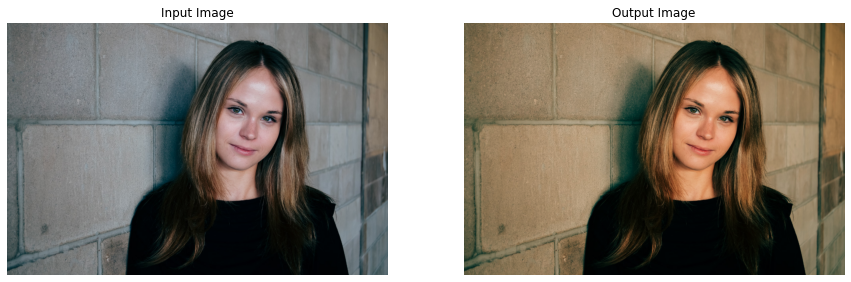

In [12]:
# Read a sample image and apply Warm filter on it.
image = cv2.imread('media/sample1.jpg')
applyWarm(image)

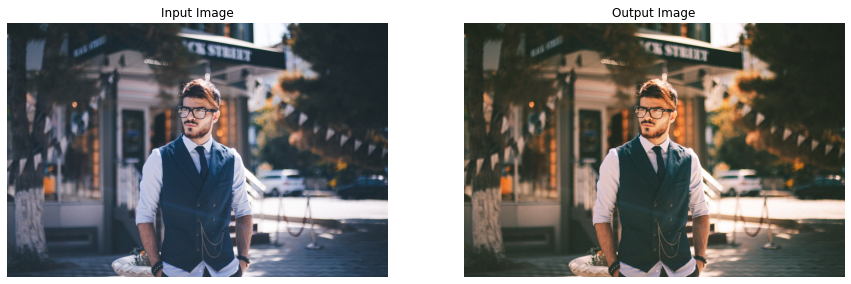

In [13]:
# Read another sample image and apply Warm filter on it.
image = cv2.imread('media/sample2.jpg')
applyWarm(image)

Woah! Got the same results as the Instagram warm filter, with just a few lines of code. Now let's move on to the next one.

## **<font style="color:rgb(134,19,348)">Creating Cold Filter-like Effect</font>**

This one is kind of the opposite of the above filter, it gives coldness look to images/videos by increasing the blue cast. To create this filter effect, we will define a  function **`applyCold()`** that will increase the pixel intensities of the blue channel and decrease the intensities of the red channel of an image/frame by utilizing the same LookUp tables, we had constructed above. 

<center><img src='https://drive.google.com/uc?export=download&id=11GZSLOnXLn3JNb6sWwsZkoySHuRir-TD' width=800></center>

For this one too, we will be using the [**`cv2.split()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga8027f9deee1e42716be8039e5863fbd9), [**`cv2.LUT()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#gab55b8d062b7f5587720ede032d34156f) and [**`cv2.merge()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga61f2f2bde4a0a0154b2333ea504fab1d) functions to split, transform, and merge the channels.

In [14]:
def applyCold(image, display=True):
    '''
    This function will create instagram Cold filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Cold filter applied. 
    '''
    
    # Split the blue, green, and red channel of the image.
    blue_channel, green_channel, red_channel = cv2.split(image)
    
    # Decrease red channel intensity using the constructed lookuptable.
    red_channel = cv2.LUT(red_channel, decrease_table).astype(np.uint8)
    
    # Increase blue channel intensity using the constructed lookuptable.
    blue_channel = cv2.LUT(blue_channel, increase_table).astype(np.uint8)
    
    # Merge the blue, green, and red channel. 
    output_image = cv2.merge((blue_channel, green_channel, red_channel))
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now we will test this cold filter effect utilizing the **`applyCold()`** function on some sample images.

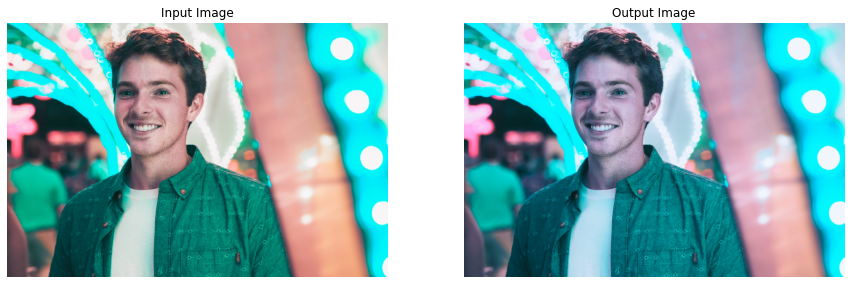

In [15]:
# Read a sample image and apply cold filter on it.
image = cv2.imread('media/sample3.jpg')
applyCold(image)

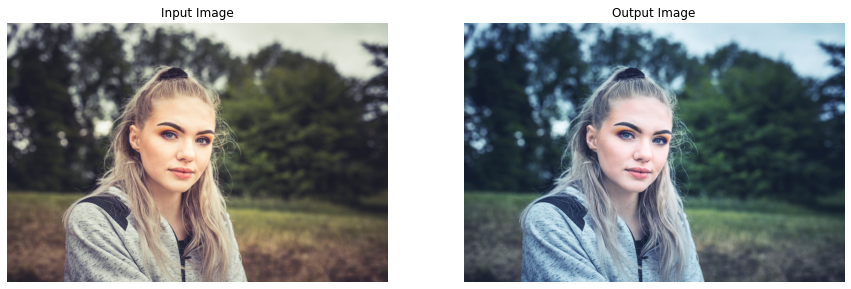

In [16]:
# Read another sample image and apply cold filter on it.
image = cv2.imread('media/sample4.jpg')
applyCold(image)

Nice! Got the expected results for this one too. 

## **<font style="color:rgb(134,19,348)">Creating Gotham Filter-like Effect</font>**

Now the famous Gotham Filter comes in, you must have heard or used this one on Instagram, it gives a warm reddish type look to images. We will try to apply a similar effect to images and videos by creating a function **`applyGotham()`**, that will utilize LookUp tables to manipulate image/frame channels in the following manner.

- Increase mid-tone contrast of the red channel 
- Boost the lower-mid values of the blue channel
- Decrease the upper-mid values of the blue channel

<center><img src='https://drive.google.com/uc?export=download&id=1HsV134lGUyZMaDaVbaZGLoIKhX2G-Nph' width=800></center>

But again first, we will have to construct the Look Up Tables required to perform the manipulation on the red and blue channels of the image. We will again utilize the [**`scipy.interpolate.UnivariateSpline()`**](https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.UnivariateSpline.html) function to get the required mapping. 

In [9]:
# Construct a lookuptable for increasing midtone contrast.
# Meaning this table will decrease the difference between the midtone values.
# Again we are giving Ys for some Xs and calculating for the remaining ones ([0-255] by using range(256)).
midtone_contrast_increase = UnivariateSpline(x=[0, 25, 51, 76, 102, 128, 153, 178, 204, 229, 255],
                                             y=[0, 13, 25, 51, 76, 128, 178, 204, 229, 242, 255])(range(256))

# Construct a lookuptable for increasing lowermid pixel values. 
lowermids_increase = UnivariateSpline(x=[0, 16, 32, 48, 64, 80, 96, 111, 128, 143, 159, 175, 191, 207, 223, 239, 255],
                                      y=[0, 18, 35, 64, 81, 99, 107, 112, 121, 143, 159, 175, 191, 207, 223, 239, 255])(range(256))

# Construct a lookuptable for decreasing uppermid pixel values.
uppermids_decrease = UnivariateSpline(x=[0, 16, 32, 48, 64, 80, 96, 111, 128, 143, 159, 175, 191, 207, 223, 239, 255],
                                      y=[0, 16, 32, 48, 64, 80, 96, 111, 128, 140, 148, 160, 171, 187, 216, 236, 255])(range(256))

# Display the first 10 mappings from the constructed tables.
print(f'First 10 elements from the midtone contrast increase table: \n {midtone_contrast_increase[:10]}\n')
print(f'First 10 elements from the lowermids increase table: \n {lowermids_increase[:10]}\n')
print(f'First 10 elements from the uppermids decrease table:: \n {uppermids_decrease[:10]}')

First 10 elements from the midtone contrast increase table: 
 [0.09416024 0.75724879 1.39938782 2.02149343 2.62448172 3.20926878
 3.77677071 4.32790362 4.8635836  5.38472674]

First 10 elements from the lowermids increase table: 
 [0.15030475 1.31080448 2.44957754 3.56865611 4.67007234 5.75585842
 6.82804653 7.88866883 8.9397575  9.98334471]

First 10 elements from the uppermids decrease table:: 
 [-0.27440589  0.8349419   1.93606131  3.02916902  4.11448171  5.19221607
  6.26258878  7.32581654  8.38211602  9.4317039 ]


Now that we have the required mappings, we can move on to creating the function **`applyGotham()`** that will utilize these LookUp tables to apply the required effect.

In [10]:
def applyGotham(image, display=True):
    '''
    This function will create instagram Gotham filter like effect on an image.
    Args:
        image:   The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Gotham filter applied. 
    '''

    # Split the blue, green, and red channel of the image.
    blue_channel, green_channel, red_channel = cv2.split(image)

    # Boost the mid-tone red channel contrast using the constructed lookuptable.
    red_channel = cv2.LUT(red_channel, midtone_contrast_increase).astype(np.uint8)
    
    # Boost the Blue channel in lower-mids using the constructed lookuptable. 
    blue_channel = cv2.LUT(blue_channel, lowermids_increase).astype(np.uint8)
    
    # Decrease the Blue channel in upper-mids using the constructed lookuptable.
    blue_channel = cv2.LUT(blue_channel, uppermids_decrease).astype(np.uint8)
    
    # Merge the blue, green, and red channel.
    output_image = cv2.merge((blue_channel, green_channel, red_channel)) 
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now, let's test this Gotham effect utilizing the **`applyGotham()`** function on a few sample images and visualize the results.

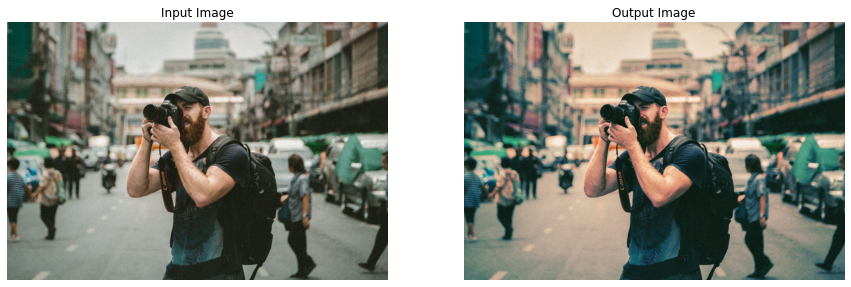

In [11]:
# Read a sample image and apply Gotham filter on it.
image = cv2.imread('media/sample5.jpg')
applyGotham(image)

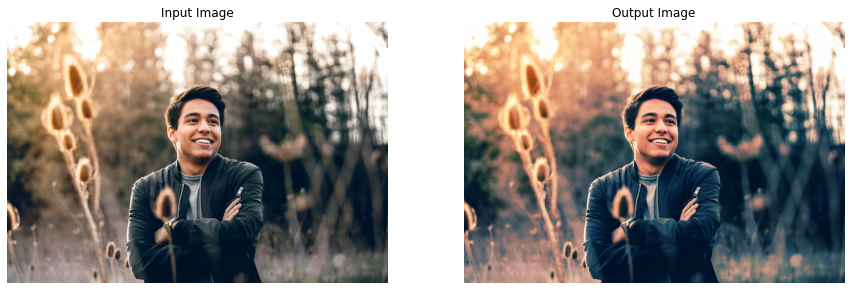

In [12]:
# Read another sample image and apply Gotham filter on it.
image = cv2.imread('media/sample6.jpg')
applyGotham(image)

Stunning results! Now, let's move to a simple one. 

## **<font style="color:rgb(134,19,348)">Creating Grayscale Filter-like Effect</font>**

Instagram also has a Grayscale filter also known as 50s TV Effect, it simply converts a (RGB) color image into a Grayscale (black and white) image. We can easily create a similar effect in OpenCV by using the [**`cv2.cvtColor()`**](https://docs.opencv.org/4.x/d8/d01/group__imgproc__color__conversions.html#ga397ae87e1288a81d2363b61574eb8cab) function. So let's create a function **`applyGrayscale()`** that will utilize [**`cv2.cvtColor()`**](https://docs.opencv.org/4.x/d8/d01/group__imgproc__color__conversions.html#ga397ae87e1288a81d2363b61574eb8cab) function to apply this Grayscale filter-like effect on images and videos.

<center><img src='https://drive.google.com/uc?export=download&id=1RhDXnOKfPoN9ErbfvXMOc-Dti2LrCN7-' width=800></center>

In [13]:
def applyGrayscale(image, display=True):
    '''
    This function will create instagram Grayscale filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Grayscale filter applied. 
    '''
    
    # Convert the image into the grayscale.
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Merge the grayscale (one-channel) image three times to make it a three-channel image.
    output_image = cv2.merge((gray, gray, gray))
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now let's utilize this **`applyGrayscale()`** function to apply the grayscale effect on a few sample images and display the results.

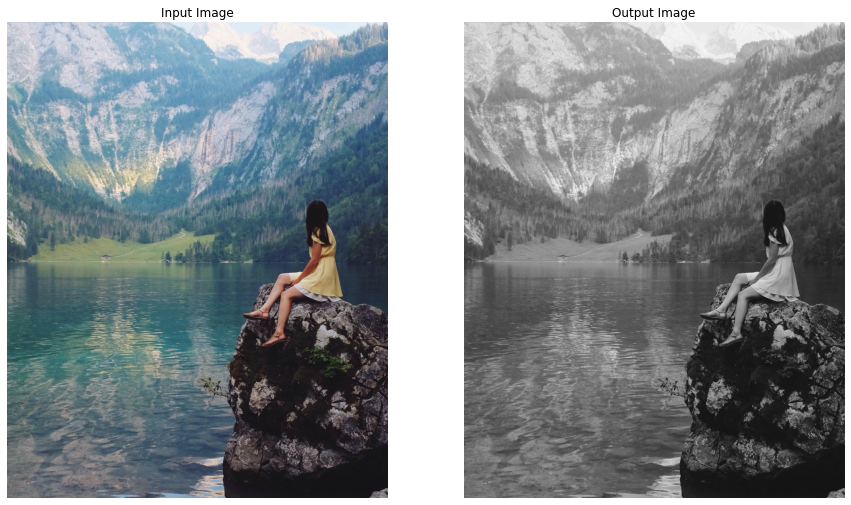

In [14]:
# Read a sample image| and apply Grayscale filter on it.
image = cv2.imread('media/sample7.jpg')
applyGrayscale(image)

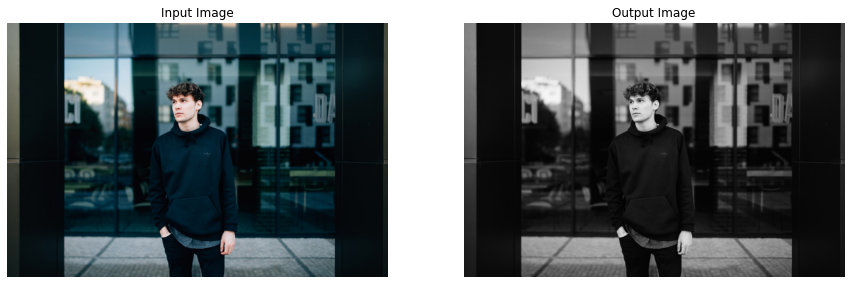

In [15]:
# Read another sample image and apply Grayscale filter on it.
image = cv2.imread('media/sample8.jpg')
applyGrayscale(image)

Cool! Working as expected. Let's move on to the next one.

## **<font style="color:rgb(134,19,348)">Creating Sepia Filter-like Effect</font>**

I think this one is the most famous among all the filters we are creating today. This gives a warm reddish-brown vintage effect to images which makes the images look a bit ancient which is really cool. To apply this effect, we will create a function **`applySepia()`** that will utilize the [**`cv2.transform()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga393164aa54bb9169ce0a8cc44e08ff22) function and the fixed sepia matrix (standardized to create this effect, that you can easily find online) to serve the purpose.

<center><img src='https://drive.google.com/uc?export=download&id=12S-kBCqgFuYSWEwAu_Iz2quWWJrATDjd' width=800></center>

In [16]:
def applySepia(image, display=True):
    '''
    This function will create instagram Sepia filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Sepia filter applied. 
    '''
    
    # Convert the image into float type to prevent loss during operations.
    image_float = np.array(image, dtype=np.float64) 
    

    
    # Manually transform the image to get the idea of exactly whats happening.
    ##################################################################################################
    
    # Split the blue, green, and red channel of the image.
    blue_channel, green_channel, red_channel = cv2.split(image_float)
    
    # Apply the Sepia filter by perform the matrix multiplication between 
    # the image and the sepia matrix.
    output_blue = (red_channel * .272) + (green_channel *.534) + (blue_channel * .131)
    output_green = (red_channel * .349) + (green_channel *.686) + (blue_channel * .168)
    output_red = (red_channel * .393) + (green_channel *.769) + (blue_channel * .189)
    
    # Merge the blue, green, and red channel.
    output_image = cv2.merge((output_blue, output_green, output_red)) 
    
    ##################################################################################################
    
    
        # OR Either create this effect by using OpenCV matrix transformation function.
    ##################################################################################################
    
    # Get the sepia matrix for BGR colorspace images.
    sepia_matrix = np.matrix([[.272, .534, .131],
                              [.349, .686, .168],
                              [.393, .769, .189]])
    
    # Apply the Sepia filter by perform the matrix multiplication between 
    # the image and the sepia matrix.
    #output_image = cv2.transform(src=image_float, m=sepia_matrix)

    ##################################################################################################
    
    
    # Set the values > 255 to 255.
    output_image[output_image > 255] = 255
    
    # Convert the image back to uint8 type.
    output_image =  np.array(output_image, dtype=np.uint8)
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now let's check this sepia effect by utilizing the **`applySepia()`** function on a few sample images.

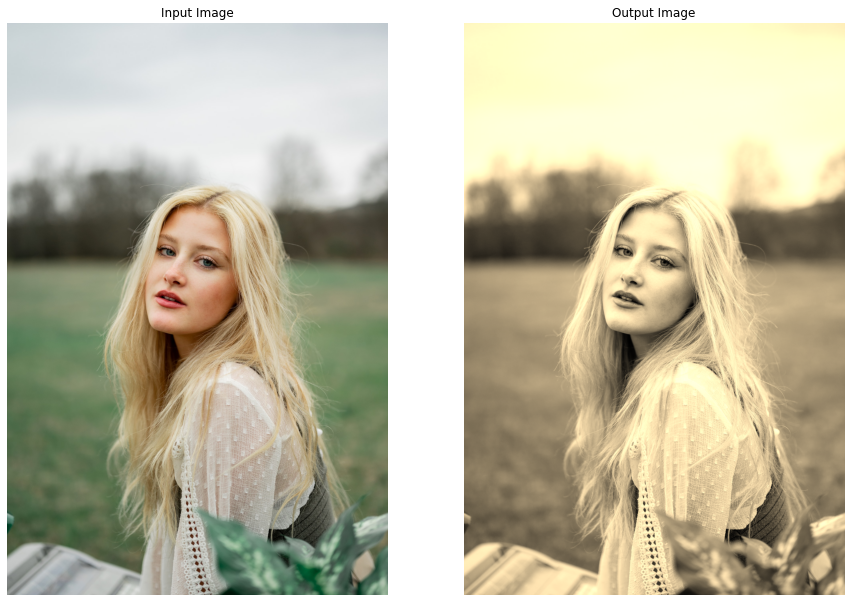

In [17]:
# Read a sample image and apply Sepia filter on it.
image = cv2.imread('media/sample9.jpg')
applySepia(image)

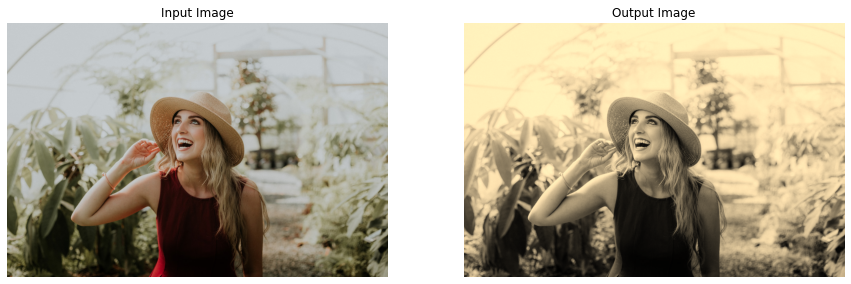

In [18]:
# Read another sample image and apply Sepia filter on it.
image = cv2.imread('media/sample18.jpg')
applySepia(image)

Spectacular results! Reminds me of the movies, I used to watch in my childhood ( Yes, I am that old 😜 ).

## **<font style="color:rgb(134,19,348)">Creating Pencil Sketch Filter-like Effect</font>**

The next one is the Pencil Sketch Filter, creating a Pencil Sketch manually requires hours of hard work but luckily in OpenCV, we can do this in just one line of code by using the function [**`cv2.pencilSketch()`**](https://docs.opencv.org/4.x/df/dac/group__photo__render.html#gae5930dd822c713b36f8529b21ddebd0c) that give a pencil sketch-like effect to images. So lets create a function **`applyPencilSketch()`** to convert images/videos into Pencil Sketches utilizing the [**`cv2.pencilSketch()`**](https://docs.opencv.org/4.x/df/dac/group__photo__render.html#gae5930dd822c713b36f8529b21ddebd0c) function.

<center><img src='https://drive.google.com/uc?export=download&id=13ZJ75GD-Swh-ZYbPtFjbZgWSzmHbPBpA' width=800></center>

We will use the following funciton to applythe pencil sketch filter, this function retruns a grayscale sketch and a colored sketch of the image

```python
  grayscale_sketch, color_sketch = cv2.pencilSketch(src_image, sigma_s, sigma_r, shade_factor)
```

This filter is a type of edge preserving filter, these filters have 2 Objectives, one is to give more weightage to pixels closer so that the blurring can be meaningfull and second to average only the similar intensity valued pixels to avoid the edges, so in this both of these objectives are controled by the two following parameters.

**`sigma_s`** Just like sigma in other smoothing filters this sigma value controls the area of the neighbourhood (Has Range between 0-200)

**`sigma_r`** This param controls the how dissimilar colors within the neighborhood will be averaged. For example a larger value will restrcit color variation and it will enforce that constant color stays throughout. (Has Range between 0-1)

**`shade_factor`** This has range 0-0.1 and controls how bright the final output will be by scaling the intensity.

In [24]:
def applyPencilSketch(image, display=True):
    '''
    This function will create instagram Pencil Sketch filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Pencil Sketch filter applied. 
    '''
    
    # Apply Pencil Sketch effect on the image.
    gray_sketch, color_sketch = cv2.pencilSketch(image, sigma_s=20, sigma_r=0.5, shade_factor=0.02)
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(131);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(132);plt.imshow(color_sketch[:,:,::-1]);plt.title("ColorSketch Image");plt.axis('off');
        plt.subplot(133);plt.imshow(gray_sketch, cmap='gray');plt.title("GraySketch Image");plt.axis('off');

    # Otherwise.
    else:
    
        # Return the output image.
        return color_sketch

Now we will apply this pencil sketch effect by utilizing the **`applyPencilSketch()`** function on a few sample images and visualize the results.

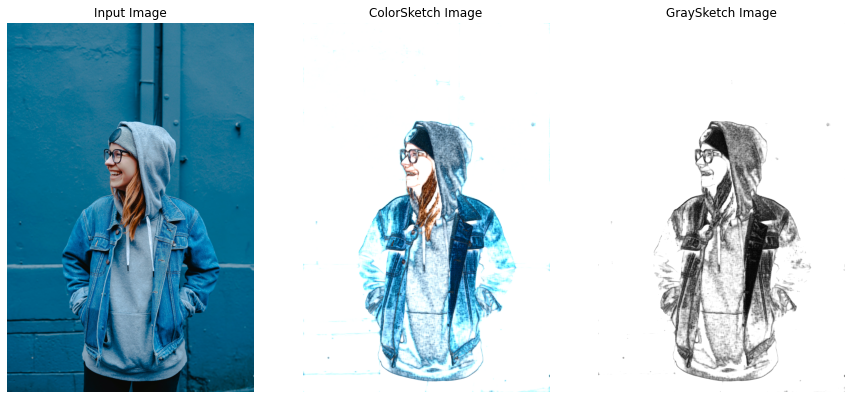

In [25]:
# Read a sample image and apply PencilSketch filter on it.
image = cv2.imread('media/sample11.jpg')
applyPencilSketch(image)

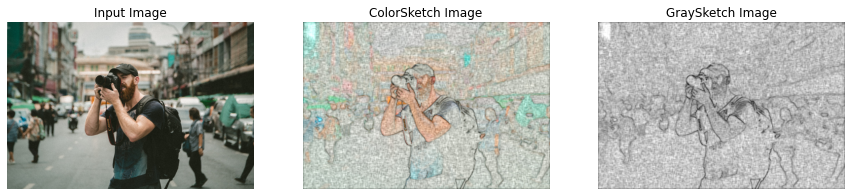

In [26]:
# Read another sample image and apply PencilSketch filter on it.
image = cv2.imread('media/sample5.jpg')
applyPencilSketch(image)

Amazing right? we created this effect with just a single line of code. So now, instead of spending hours manually sketching someone or something, you can take an image and apply this effect on it to get the results in seconds. And you can further tune the parameters of the **`cv2.pencilSketch()`** function to get even better results.

## **<font style="color:rgb(134,19,348)">Creating Sharpening Filter-like Effect</font>**

Now let's try to create the Sharpening Effect, this enhances the clearness of an image/video and decreases the blurriness which gives a new interesting look to the image/video. For this we will create a function  **`applySharpening()`** that will utilize the [**`cv2.filter2D()`**](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04) function to give the required effect to an image/frame passed to it.

<center><img src='https://drive.google.com/uc?export=download&id=1N43WOAUn14y0XrGo0vN0GkCKlC3Y4bUI' width=800></center>

In [27]:
 def applySharpening(image, display=True):
    '''
    This function will create the Sharpening filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Sharpening filter applied. 
    '''
    
    # Get the kernel required for the sharpening effect.
    sharpening_kernel = np.array([[-1, -1, -1],
                                  [-1, 9.2, -1],
                                  [-1, -1, -1]])
    
    # Apply the sharpening filter on the image.
    output_image = cv2.filter2D(src=image, ddepth=-1, 
                                kernel=sharpening_kernel)
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now, let's see this in action utilizing the **`applySharpening()`** function created above on a few sample images.

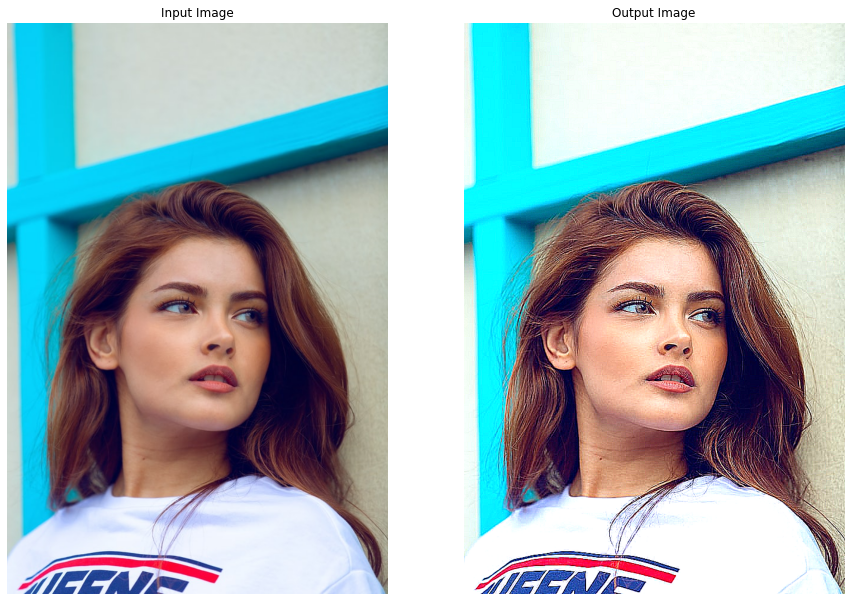

In [28]:
# Read a sample image and apply Sharpening filter on it.
image = cv2.imread('media/sample12.jpg')
applySharpening(image)

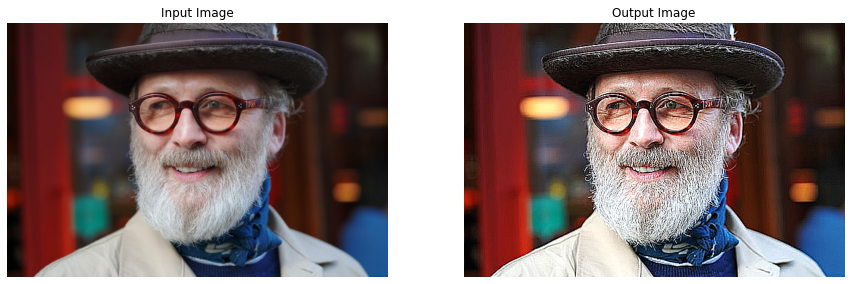

In [29]:
# Read another sample image and apply Sharpening filter on it.
image = cv2.imread('media/sample13.jpg')
applySharpening(image)

Nice! this filter makes the original images look as if they are out of focus (blur).

## **<font style="color:rgb(134,19,348)">Creating a Detail Enhancing Filter</font>**

Now this Filter is another type of edge preserving fitler and has the same parameters as the pencil sketch filter.This filter intensifies the details in images/videos, we'll be using the function called [**`cv2.detailEnhance()`**](https://docs.opencv.org/4.x/df/dac/group__photo__render.html#ga0de660cb6f371a464a74c7b651415975). let's start by creating the a wrapper function **`applyDetailEnhancing()`**, that will utilize the [**`cv2.detailEnhance()`**](https://docs.opencv.org/4.x/df/dac/group__photo__render.html#ga0de660cb6f371a464a74c7b651415975) function to apply the needed effect.

<center><img src='https://drive.google.com/uc?export=download&id=1lEk27gpIHVxEJE9dJuXkxRk3M7CgpbIK' width=800></center>

In [30]:
def applyDetailEnhancing(image, display=True):
    '''
    This function will create the HDR filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the HDR filter applied. 
    '''
    
    # Apply the detail enhancing effect by enhancing the details of the image.
    output_image = cv2.detailEnhance(image, sigma_s=15, sigma_r=0.15)
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now, let's test the function **`applyDetailEnhancing()`** created above on a few sample images.

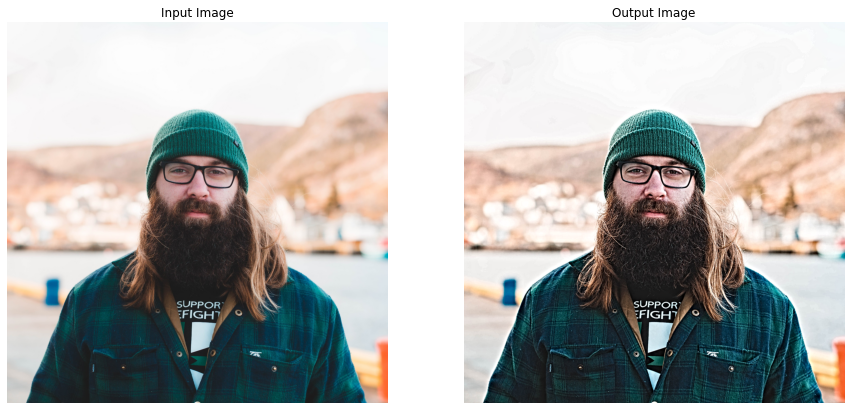

In [31]:
# Read a sample image and apply Detail Enhancing filter on it.
image = cv2.imread('media/sample14.jpg')
applyDetailEnhancing(image)

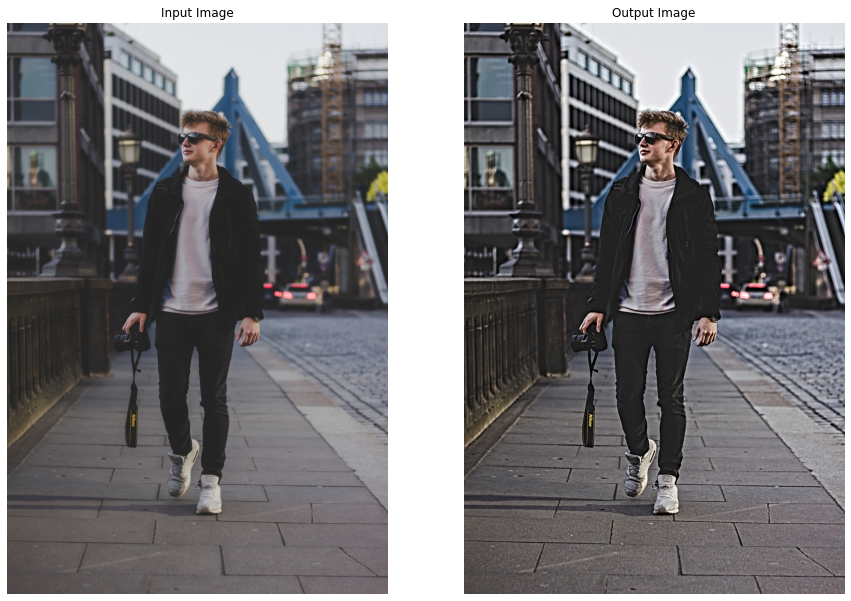

In [32]:
# Read another sample image and apply Detail Enhancing filter on it.
image = cv2.imread('media/sample15.jpg')
applyDetailEnhancing(image)

Satisfying results! let's move on to the next one.

## **<font style="color:rgb(134,19,348)">Creating Invert Filter-like Effect</font>**

This filter inverts the colors in images/videos meaning changes darkish colors into light and vice versa, which gives a very interesting look to images/videos. This can be accomplished using multiple approaches we can either utilize a LookUp table to perform the required transformation or subtract the image by `255` and take absolute of the results or just simply use the OpenCV function [**`cv2.bitwise_not()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga0002cf8b418479f4cb49a75442baee2f). Let's create a function **`applyInvert()`** to serve the purpose.

<center><img src='https://drive.google.com/uc?export=download&id=1S5bLSFqk0MriLYFpeDPt3eR7MkPFJayM' width=800></center>

In [33]:
def applyInvert(image, display=True):
    '''
    This function will create the Invert filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the Invert filter applied. 
    '''
    
    # Apply the Invert Filter on the image. 
    output_image = cv2.bitwise_not(image)
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Let's check this effect on a few sample images utilizing the **`applyInvert()`** function.

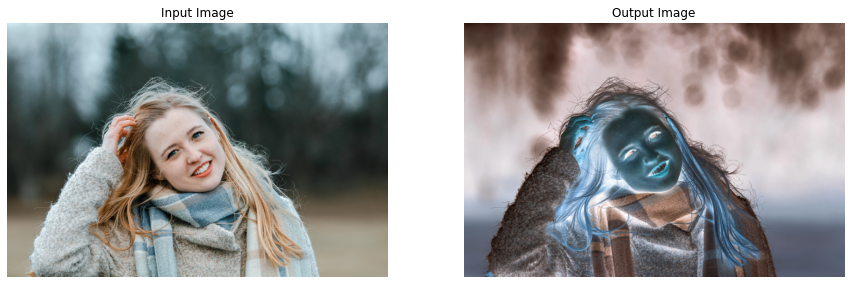

In [34]:
# Read a sample image and apply invert filter on it.
image = cv2.imread('media/sample16.jpg')
applyInvert(image)

Looks a little scary, lets's try it on a few landscape images.

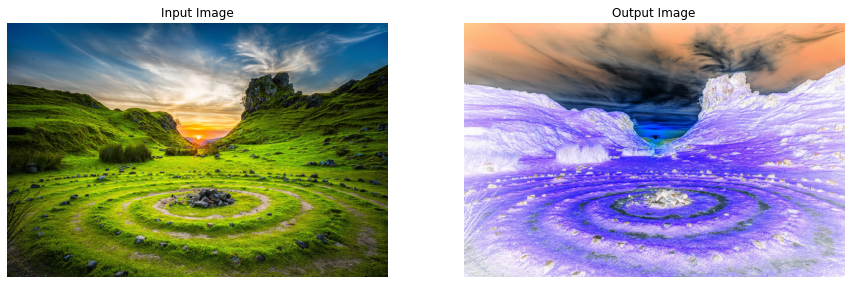

In [35]:
# Read a landscape image and apply invert filter on it.
image = cv2.imread('media/sample19.jpg')
applyInvert(image)

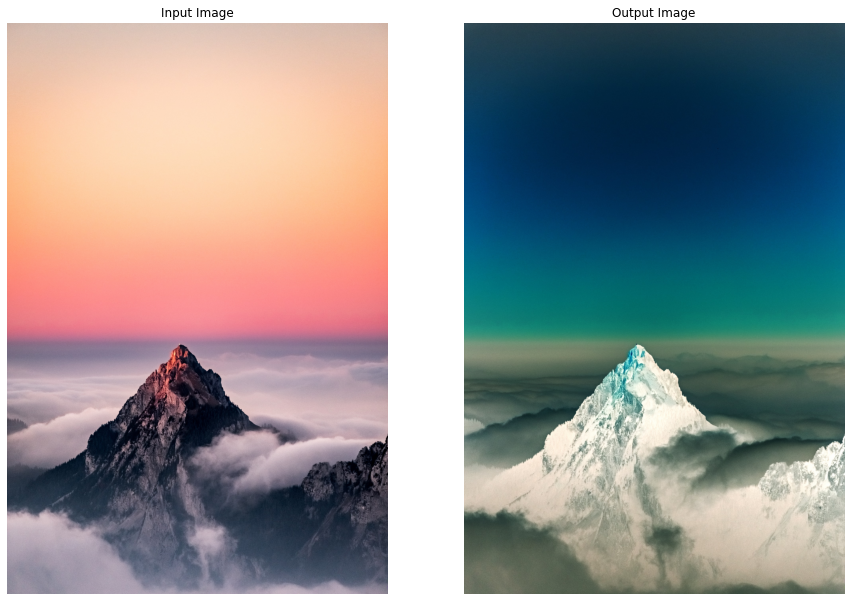

In [36]:
# Read another landscape image and apply invert filter on it.
image = cv2.imread('media/sample20.jpg')
applyInvert(image)

Interesting effect! but I will definitely not recommend using this one on your own images, except if your intention is to scare someone xD.

## **<font style="color:rgb(134,19,348)">Creating Stylization Filter-like Effect</font>**

Now let's move on to the final one, which gives a painting-like effect to images. We will create a function **`applyStylization()`** that will utilize the [**`cv2.stylization()`**](https://docs.opencv.org/4.x/df/dac/group__photo__render.html#gacb0f7324017df153d7b5d095aed53206) function to apply this effect on images and videos. This one too will only need a single line of code.

<center><img src='https://drive.google.com/uc?export=download&id=1cmIv2MTclw74cI07F4-tucqlXYcMqVzW' width=800></center>

In [37]:
def applyStylization(image, display=True):
    '''
    This function will create instagram cartoon-paint filter like effect on an image.
    Args:
        image:  The image on which the filter is to be applied.
        display: A boolean value that is if set to true the function displays the original image,
                 and the output image, and returns nothing.
    Returns:
        output_image: A copy of the input image with the cartoon-paint filter applied. 
    '''
    
    # Apply stylization effect on the image.
    output_image = cv2.stylization(image, sigma_s=15, sigma_r=0.55) 
    
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Input Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    # Otherwise.
    else:
    
        # Return the output image.
        return output_image

Now, as done for every other filter, we will utilize the function **`applyStylization()`** to test this effect on a few sample images.

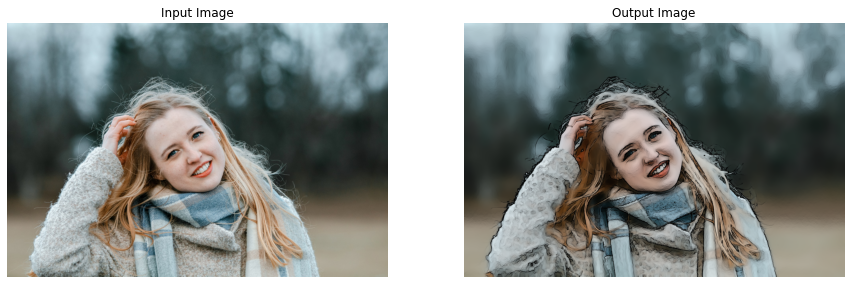

In [38]:
# Read a sample image and apply Stylization filter on it.
image = cv2.imread('media/sample16.jpg')
applyStylization(image)

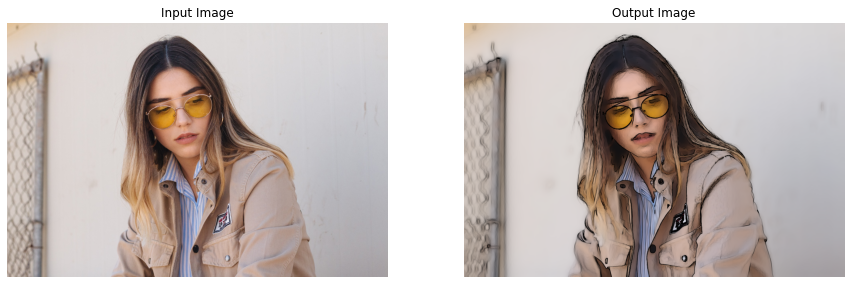

In [39]:
# Read another sample image and apply Stylization filter on it.
image = cv2.imread('media/sample17.jpg')
applyStylization(image)

Again got fascinating results! Wasn't that fun to see how simple it is to create all these effects?

## **<font style="color:rgb(134,19,348)">Apply Instagram Filters On a Real-Time Web-cam Feed</font>**

Now that we have created the filters and have tested them on images, let's move to apply these on a real-time webcam feed, first, we will have to create a mouse event callback function **`mouseCallback()`**, similar to the one we had created for the Color Filters in the [previous tutorial](), the function will allow us to select the filter to apply, and capture and store images into the disk by utilizing mouse events in real-time.

In [40]:
def mouseCallback(event, x, y, flags, userdata):
    '''
    This function will update the filter to apply on the frame and capture images based on different mouse events.
    Args:
        event:    The mouse event that is captured.
        x:        The x-coordinate of the mouse pointer position on the window.
        y:        The y-coordinate of the mouse pointer position on the window.
        flags:    It is one of the MouseEventFlags constants.
        userdata: The parameter passed from the `cv2.setMouseCallback()` function.
    '''
    #  Access the filter applied, and capture image state variable.
    global filter_applied, capture_image
    
    # Check if the left mouse button is pressed.
    if event == cv2.EVENT_LBUTTONDOWN:
        
        # Check if the mouse pointer is over the camera icon ROI.
        if y >= (frame_height-10)-camera_icon_height and \
        x >= (frame_width//2-camera_icon_width//2) and \
        x <= (frame_width//2+camera_icon_width//2):
            
            # Update the image capture state to True.
            capture_image = True
        
        # Check if the mouse pointer y-coordinate is over the filters ROI.
        elif y <= 10+preview_height:
            
            # Check if the mouse pointer x-coordinate is over the Warm filter ROI.
            if x>(int(frame_width//11.6)-preview_width//2) and \
            x<(int(frame_width//11.6)-preview_width//2)+preview_width: 
                
                # Update the filter applied variable value to Warm.
                filter_applied = 'Warm'
                
            # Check if the mouse pointer x-coordinate is over the Cold filter ROI.
            elif x>(int(frame_width//5.9)-preview_width//2) and \
            x<(int(frame_width//5.9)-preview_width//2)+preview_width: 
                
                # Update the filter applied variable value to Cold.
                filter_applied = 'Cold'
                
            # Check if the mouse pointer x-coordinate is over the Gotham filter ROI.
            elif x>(int(frame_width//3.97)-preview_width//2) and \
            x<(int(frame_width//3.97)-preview_width//2)+preview_width: 
                
                # Update the filter applied variable value to Gotham.
                filter_applied = 'Gotham'
                
            # Check if the mouse pointer x-coordinate is over the Grayscale filter ROI.
            elif x>(int(frame_width//2.99)-preview_width//2) and \
            x<(int(frame_width//2.99)-preview_width//2)+preview_width: 
                
                # Update the filter applied variable value to Grayscale.
                filter_applied = 'Grayscale'
                
            # Check if the mouse pointer x-coordinate is over the Sepia filter ROI.
            elif x>(int(frame_width//2.395)-preview_width//2) and \
            x<(int(frame_width//2.395)-preview_width//2)+preview_width: 
                
                # Update the filter applied variable value to Sepia.
                filter_applied = 'Sepia'
            
            # Check if the mouse pointer x-coordinate is over the Normal filter ROI.
            elif x>(int(frame_width//2)-preview_width//2) and \
            x<(int(frame_width//2)-preview_width//2)+preview_width:
                
                # Update the filter applied variable value to Normal.
                filter_applied = 'Normal'
                
            # Check if the mouse pointer x-coordinate is over the Pencil Sketch filter ROI.
            elif x>(frame_width//1.715-preview_width//2) and \
            x<(frame_width//1.715-preview_width//2)+preview_width: 
                
                # Update the filter applied variable value to Pencil Sketch.
                filter_applied = 'Pencil Sketch'
            
            # Check if the mouse pointer x-coordinate is over the Sharpening filter ROI.
            elif x>(int(frame_width//1.501)-preview_width//2) and \
            x<(int(frame_width//1.501)-preview_width//2)+preview_width:
                
                # Update the filter applied variable value to Sharpening.
                filter_applied = 'Sharpening'
            
            # Check if the mouse pointer x-coordinate is over the Invert filter ROI.
            elif x>(int(frame_width//1.335)-preview_width//2) and \
            x<(int(frame_width//1.335)-preview_width//2)+preview_width:
                
                # Update the filter applied variable value to Invert.
                filter_applied = 'Invert'
            
            # Check if the mouse pointer x-coordinate is over the Detail Enhancing filter ROI.
            elif x>(int(frame_width//1.202)-preview_width//2) and \
            x<(int(frame_width//1.202)-preview_width//2)+preview_width:
                
                # Update the filter applied variable value to Detail Enhancing.
                filter_applied = 'Detail Enhancing'
                
            # Check if the mouse pointer x-coordinate is over the Stylization filter ROI.
            elif x>(int(frame_width//1.094)-preview_width//2) and \
            x<(int(frame_width//1.094)-preview_width//2)+preview_width:
                
                # Update the filter applied variable value to Stylization.
                filter_applied = 'Stylization'   

Now that we have a mouse event callback function **`mouseCallback()`** to select a filter to apply, we will create another function **`applySelectedFilter()`** that we will need, to check which filter is selected at the moment and apply that filter to the image/frame in real-time.

In [41]:
def applySelectedFilter(image, filter_applied):
    '''
    This function will apply the selected filter on an image.
    Args:
        image:          The image on which the selected filter is to be applied.
        filter_applied: The name of the filter selected by the user.
    Returns:
        output_image: A copy of the input image with the selected filter applied. 
    '''
    
    # Check if the specified filter to apply, is the Warm filter.
    if filter_applied == 'Warm':
        
        # Apply the Warm Filter on the image. 
        output_image = applyWarm(image, display=False)
    
    # Check if the specified filter to apply, is the Cold filter.
    elif filter_applied == 'Cold':
        
        # Apply the Cold Filter on the image. 
        output_image = applyCold(image, display=False)
        
    # Check if the specified filter to apply, is the Gotham filter.
    elif filter_applied == 'Gotham':
        
        # Apply the Gotham Filter on the image. 
        output_image = applyGotham(image, display=False)
        
     # Check if the specified filter to apply, is the Grayscale filter.
    elif filter_applied == 'Grayscale':
        
        # Apply the Grayscale Filter on the image. 
        output_image = applyGrayscale(image, display=False)  

    # Check if the specified filter to apply, is the Sepia filter.
    if filter_applied == 'Sepia':
        
        # Apply the Sepia Filter on the image. 
        output_image = applySepia(image, display=False)
    
    # Check if the specified filter to apply, is the Pencil Sketch filter.
    elif filter_applied == 'Pencil Sketch':
        
        # Apply the Pencil Sketch Filter on the image. 
        output_image = applyPencilSketch(image, display=False)
    
    # Check if the specified filter to apply, is the Sharpening filter.
    elif filter_applied == 'Sharpening':
        
        # Apply the Sharpening Filter on the image. 
        output_image = applySharpening(image, display=False)
        
    # Check if the specified filter to apply, is the Invert filter.
    elif filter_applied == 'Invert':
        
        # Apply the Invert Filter on the image. 
        output_image = applyInvert(image, display=False)
        
    # Check if the specified filter to apply, is the Detail Enhancing filter.
    elif filter_applied == 'Detail Enhancing':
        
        # Apply the Detail Enhancing Filter on the image. 
        output_image = applyDetailEnhancing(image, display=False)
        
    # Check if the specified filter to apply, is the Stylization filter.
    elif filter_applied == 'Stylization':
        
        # Apply the Stylization Filter on the image. 
        output_image = applyStylization(image, display=False)
    
    # Return the image with the selected filter applied.`
    return output_image

Now that we will the required functions, let's test the filters on a real-time webcam feed, we will be switching between the filters by utilizing the **`mouseCallback()`** and **`applySelectedFilter()`** functions created above and will overlay a Camera ROI over the frame and allow the user to capture images with the selected filter applied, by clicking on the Camera ROI in real-time.

In [43]:
# Initialize the VideoCapture object to read from the webcam.
camera_video = cv2.VideoCapture(1, cv2.CAP_DSHOW)
camera_video.set(3,1280)
camera_video.set(4,960)

# Create a named resizable window.
cv2.namedWindow('Instagram Filters', cv2.WINDOW_NORMAL)

# Attach the mouse callback function to the window.
cv2.setMouseCallback('Instagram Filters', mouseCallback)

# Initialize a variable to store the current applied filter.
filter_applied = 'Normal'

# Initialize a variable to store the copies of the frame 
# with the filters applied.
filters = None

# Initialize the pygame modules and load the image-capture music file.
pygame.init()
pygame.mixer.music.load("media/camerasound.mp3")

# Initialize a variable to store the image capture state.
capture_image = False

# Initialize a variable to store a camera icon image.
camera_icon = None

# Iterate until the webcam is accessed successfully.
while camera_video.isOpened():
   
    # Read a frame.
    ok, frame = camera_video.read()
    
    # Check if frame is not read properly then 
    # continue to the next iteration to read the next frame.
    if not ok:
        continue
        
    # Get the height and width of the frame of the webcam video.
    frame_height, frame_width, _ = frame.shape
    
    # Flip the frame horizontally for natural (selfie-view) visualization.
    frame = cv2.flip(frame, 1)    
    
    # Check if the filters variable doesnot contain the filters. 
    if not(filters):
        
        # Update the filters variable to store a dictionary containing multiple
        # copies of the frame with all the filters applied.
        filters = {'Normal': frame.copy(), 'Warm' : applyWarm(frame, display=False),
                   'Cold'  :applyCold(frame, display=False),
                   'Gotham' : applyGotham(frame, display=False),
                   'Grayscale' : applyGrayscale(frame, display=False),
                   'Sepia' : applySepia(frame, display=False),
                   'Pencil Sketch' : applyPencilSketch(frame, display=False),
                   'Sharpening': applySharpening(frame, display=False),
                   'Invert': applyInvert(frame, display=False),
                   'Detail Enhancing': applyDetailEnhancing(frame, display=False),
                   'Stylization': applyStylization(frame, display=False)}
    
    # Initialize a list to store the previews of the filters.
    filters_previews = []
    
    # Iterate over the filters dictionary.
    for filter_name, filtered_frame in filters.items():
        
        # Check if the filter we are iterating upon, is applied.
        if filter_applied == filter_name:
            
            # Set color to green.
            # This will be the border color of the filter preview.
            # And will be green for the filter applied and white for the other filters.
            color = (0,255,0)
            
        # Otherwise.
        else:
            
            # Set color to white.
            color = (255,255,255)
            
        # Make a border around the filter we are iterating upon.
        filter_preview = cv2.copyMakeBorder(src=filtered_frame, top=100, bottom=100,
                                            left=10, right=10, borderType=cv2.BORDER_CONSTANT,
                                            value=color)

        # Resize the preview to the 1/12th of its current width and height.
        filter_preview = cv2.resize(filter_preview, (frame_width//12,frame_height//12))
        
        # Append the filter preview into the list.
        filters_previews.append(filter_preview)
    
    # Get the new height and width of the previews.
    preview_height, preview_width, _ = filters_previews[0].shape
    
    # Check if any filter is selected.
    if filter_applied != 'Normal':
    
        # Apply the selected Filter on the frame.
        frame = applySelectedFilter(frame, filter_applied)
        
     # Check if the image capture state is True.
    if capture_image:
        
        # Capture an image and store it in the disk.
        cv2.imwrite('Captured_Image.png', frame)

        # Display a black image.
        cv2.imshow('Instagram Filters', np.zeros((frame_height, frame_width)))

        # Play the image capture music to indicate that an image is captured and wait for 100 milliseconds.
        pygame.mixer.music.play()
        cv2.waitKey(100)

        # Display the captured image.
        plt.close();plt.figure(figsize=[10, 10])
        plt.imshow(frame[:,:,::-1]);plt.title("Captured Image");plt.axis('off');
        
        # Update the image capture state to False.
        capture_image = False
        
    # Check if the camera icon variable doesnot contain the camera icon image.
    if not(camera_icon):
        
        # Read a camera icon png image with its blue, green, red, and alpha channel.
        camera_iconBGRA = cv2.imread('media/cameraicon.png', cv2.IMREAD_UNCHANGED)
        
        # Resize the camera icon image to the 1/12th of the frame width,
        # while keeping the aspect ratio constant.
        camera_iconBGRA = cv2.resize(camera_iconBGRA, 
                                     (frame_width//12,
                                      int(((frame_width//12)/camera_iconBGRA.shape[1])*camera_iconBGRA.shape[0])))
        
        # Get the new height and width of the camera icon image.
        camera_icon_height, camera_icon_width, _ = camera_iconBGRA.shape
        
        # Get the first three-channels (BGR) of the camera icon image.
        camera_iconBGR  = camera_iconBGRA[:,:,:-1]
        
        # Get the alpha channel of the camera icon.
        camera_icon_alpha =  camera_iconBGRA[:,:,-1]
    
    # Get the region of interest of the frame where the camera icon image will be placed.
    frame_roi = frame[(frame_height-10)-camera_icon_height: (frame_height-10),
                      (frame_width//2-camera_icon_width//2): \
                      (frame_width//2-camera_icon_width//2)+camera_icon_width]
        
    # Overlay the camera icon over the frame by updating the pixel values of the frame
    # at the indexes where the alpha channel of the camera icon image has the value 255.
    frame_roi[camera_icon_alpha==255] = camera_iconBGR[camera_icon_alpha==255]
        
    # Overlay the resized preview filter images over the frame by updating
    # its pixel values in the region of interest.
    #######################################################################################
    
    # Overlay the Warm Filter preview on the frame.  
    frame[10: 10+preview_height,
          (int(frame_width//11.6)-preview_width//2): \
          (int(frame_width//11.6)-preview_width//2)+preview_width] = filters_previews[1]
        
    # Overlay the Cold Filter preview on the frame.  
    frame[10: 10+preview_height,
          (int(frame_width//5.9)-preview_width//2): \
          (int(frame_width//5.9)-preview_width//2)+preview_width] = filters_previews[2]
    
    # Overlay the Gotham Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//3.97)-preview_width//2): \
          (int(frame_width//3.97)-preview_width//2)+preview_width] = filters_previews[3]
    
    
    # Overlay the Grayscale Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//2.99)-preview_width//2): \
          (int(frame_width//2.99)-preview_width//2)+preview_width] = filters_previews[4]
    
    # Overlay the Sepia Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//2.395)-preview_width//2): \
          (int(frame_width//2.395)-preview_width//2)+preview_width] = filters_previews[5]   

    # Overlay the Normal frame (no filter) preview on the frame.
    frame[10: 10+preview_height,
          (frame_width//2-preview_width//2): \
          (frame_width//2-preview_width//2)+preview_width] = filters_previews[0]
    
    # Overlay the Pencil Sketch Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//1.715)-preview_width//2): \
          (int(frame_width//1.715)-preview_width//2)+preview_width]=filters_previews[6]
    
    # Overlay the Sharpening Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//1.501)-preview_width//2): \
          (int(frame_width//1.501)-preview_width//2)+preview_width]=filters_previews[7]
    
    # Overlay the Invert Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//1.335)-preview_width//2): \
          (int(frame_width//1.335)-preview_width//2)+preview_width]=filters_previews[8]
    
    # Overlay the Detail Enhancing Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//1.202)-preview_width//2): \
          (int(frame_width//1.202)-preview_width//2)+preview_width]=filters_previews[9]
    
    # Overlay the Stylization Filter preview on the frame.
    frame[10: 10+preview_height,
          (int(frame_width//1.094)-preview_width//2): \
          (int(frame_width//1.094)-preview_width//2)+preview_width]=filters_previews[10]
    
    #######################################################################################

    # Display the frame.
    cv2.imshow('Instagram Filters', frame)
    
    # Wait for 1ms. If a key is pressed, retreive the ASCII code of the key.
    k = cv2.waitKey(1) & 0xFF
    
    # Check if 'ESC' is pressed and break the loop.
    if(k == 27):
        break

# Release the VideoCapture Object and close the windows.
camera_video.release()
cv2.destroyAllWindows()

Awesome! working as expected on the videos too. 

##  <font style="color:rgb(34,169,134)">Assignment (Optional)</font>

Create your own Filter with an appropriate name by playing around with the techniques you have learned in this tutorial, and share the results with me in the comments section.

In [38]:
## ADD CODE HERE